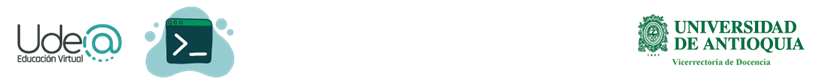

**Autor:**  

*   Juan Diego Sánchez Ramos

**Tratamiento de Señales III**

**Facultad de Ingeniería**

**Universidad de Antioquia**

# .1


---



In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.naive_bayes import GaussianNB

In [ ]:
Datos = pd.read_csv('Dataframe.csv')

In [ ]:
Datos

,Emociones,Promedio GSR,PromedioDevNeg,Potencia 1 GSR,Potencia 2 GSR,Potencia 3 GSR,Potencia 4 GSR,Potencia 5 GSR,Potencia 6 GSR,Potencia 7 GSR,...,Pot Gamma T7,Pot Alpha T8,Pot Beta T8,Pot Gamma T8,Pot Alpha P3,Pot Beta P3,Pot Gamma P3,Pot Alpha P4,Pot Beta P4,Pot Gamma P4
0,2.0,-18005.683435,-11.957541,35101.815708,13178.637609,10943.625239,5227.748578,3659.268212,3582.305669,3303.168793,...,523951.368577,123474.652548,213644.444876,161842.024721,102777.708818,133622.450052,72629.374280,93140.400070,170488.173405,130950.462267
1,1.0,-8794.650746,-4.848997,17218.271567,9570.626201,6122.338964,2811.452175,2017.247881,1804.976555,1427.649930,...,136932.783447,125225.461497,128403.720741,43542.249373,78004.463161,92226.166123,21849.951774,85340.864049,108062.651527,36306.456444
2,2.0,-1331.408630,0.001537,3133.742160,2709.463519,992.901531,451.513567,338.611045,267.464809,227.198199,...,363471.964280,132256.389626,148671.654593,73650.126282,90410.528442,101861.166110,38330.086968,90797.947185,125316.001544,87578.563557
3,2.0,3491.283824,0.856576,6948.160591,4281.636322,1838.875305,1426.125289,1114.163844,943.564315,927.775251,...,213720.882270,155118.970487,162179.257311,62076.144235,96418.719358,106346.522023,26242.934697,92199.599080,129752.719052,61684.034784
4,0.0,-3736.386024,-1.330096,7342.836193,3939.745737,1644.788651,1378.645827,1323.621008,1272.618271,1083.620202,...,94499.775900,270957.740112,161778.309943,41693.096882,115210.267186,106079.431017,18267.633708,134218.155394,103571.860167,32947.590238
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
155,0.0,5204.994820,0.000000,10264.858344,1869.415737,1319.169388,967.213366,910.461461,484.434597,457.754573,...,41486.349173,39372.624038,45389.054493,5562.405335,60589.374741,75754.674662,8453.137934,144825.709603,100021.190372,10769.906744
156,0.0,2975.633960,-0.015518,5796.412630,4123.242888,1063.102877,1037.915772,1013.496086,654.383367,563.667292,...,94848.982375,30231.617221,37536.640174,4837.561803,63094.154890,71848.586923,8055.022319,138909.857168,87693.780127,9736.232956
157,0.0,7866.527529,0.000000,15463.890747,5536.833430,2237.235486,1391.740732,1175.259692,1011.831573,838.158038,...,90949.442445,25645.840106,43567.234279,5879.899895,72789.632384,82068.022293,10617.001600,153565.543627,99220.130917,13191.820666
158,2.0,-2334.049943,-0.469599,4621.097401,1405.293496,864.042961,815.025314,799.044684,528.125969,466.127071,...,533588.824780,18330.175722,36925.376317,8571.229575,50735.371763,61188.891325,8976.327982,150924.324925,92358.898523,10651.557442


In [ ]:
Datos_SE= Datos.iloc[:, 1:]
Emo = Datos['Emociones']

In [ ]:
Codi = LabelEncoder()
Emo_Codi = Codi.fit_transform(Emo) # Aprende y aplica la transformación en los datos de entrenamiento en una sola llamada

<Axes: xlabel='Componente 1', ylabel='Componente 2'>

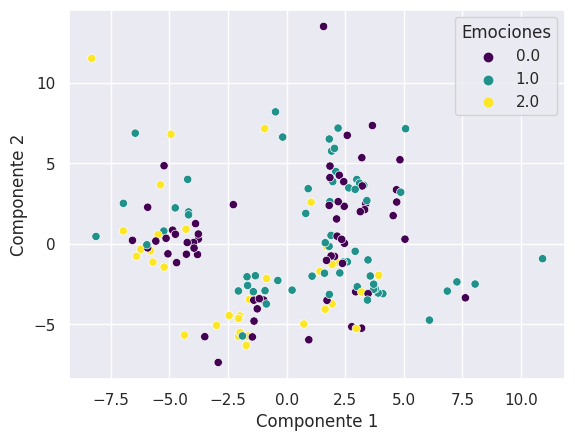

In [ ]:


# Se normalizan las características y se reemplazan NaN e infinitos con ceros
scaler = StandardScaler()
X_normalized = scaler.fit_transform(Datos_SE)
X_normalized[np.isnan(X_normalized)] = 0
X_normalized[np.isinf(X_normalized)] = 0

# Análisis de Componentes Principales (PCA)
pca = PCA(n_components=2)
pca_xn = pca.fit_transform(X_normalized)

# DataFrame para los componentes principales
DatosPCA = pd.DataFrame(data=pca_xn, columns=['Componente 1', 'Componente 2'])
DatosPCA['Emociones'] = Emo  # Agregar las etiquetas emocionales a los componentes principales

# Visualizar los resultados con Seaborn
sns.scatterplot(data=DatosPCA, x='Componente 1', y='Componente 2', hue='Emociones', palette='viridis')


**Número de componentes = 5:**

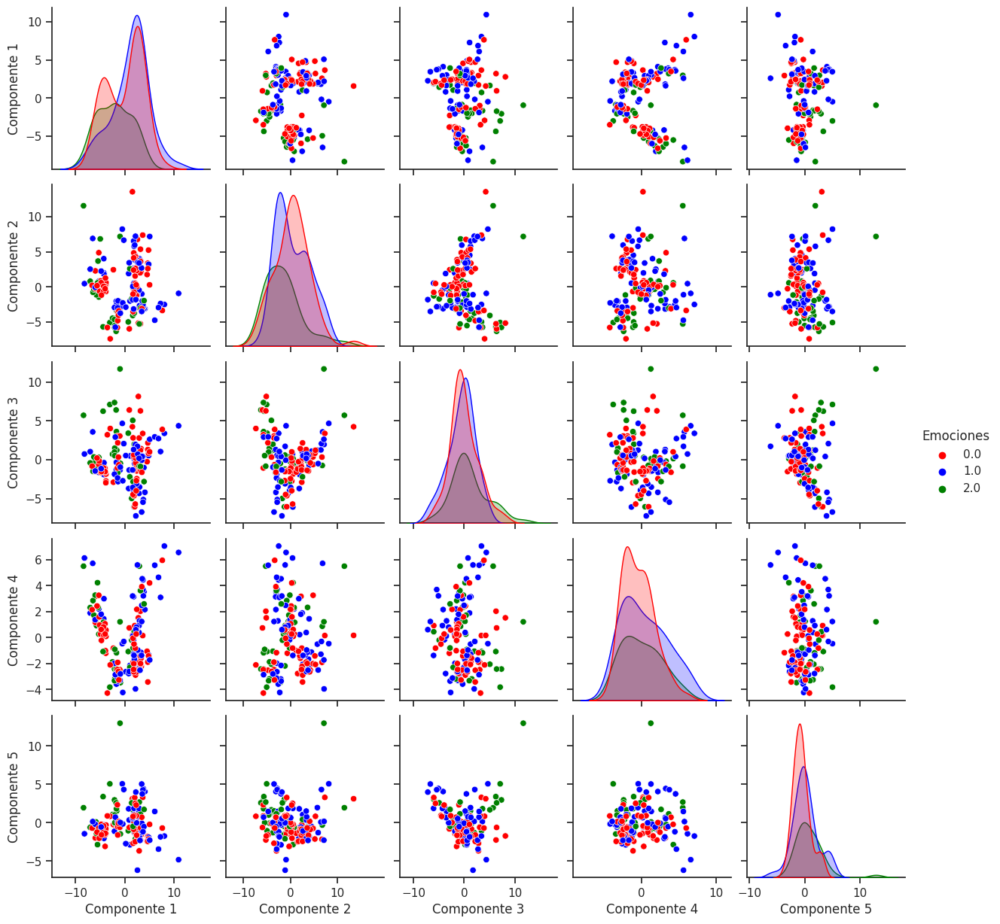

In [ ]:
pca = PCA(n_components=5)
pca_xn = pca.fit_transform(X_normalized)

DatosPCA = pd.DataFrame(data=pca_xn, columns=['Componente 1', 'Componente 2', 'Componente 3', 'Componente 4', 'Componente 5'])
DatosPCA['Emociones'] = Emo
# Define una paleta de colores personalizada
colors = ["red", "blue", "green"]  # Puedes personalizar los colores a tu gusto

# Crea el pairplot con la paleta de colores personalizada
sns.set(style="ticks")
pairplot = sns.pairplot(DatosPCA, hue="Emociones", palette=colors)

# Mostrar el gráfico
plt.show()

 **Número de componentes = número de características:**

In [ ]:
from sklearn.decomposition import PCA



# Inicializa el modelo PCA con un número máximo de componentes
pca_model = PCA(n_components=X_normalized.shape[1])
pca_model.fit(X_normalized)

#  varianza explicada acumulativa
explained_variance_ratios = np.cumsum(pca_model.explained_variance_ratio_)


desired_variance_threshold = 0.90

# Encuentra el número de componentes necesarios para alcanzar o superar el umbral
num_components_needed = np.argmax(explained_variance_ratios >= desired_variance_threshold) + 1

print(f"Número de componentes necesarios para preservar el {desired_variance_threshold * 100}% de la varianza: {num_components_needed}")

porcentaje = ((X_normalized.shape[1] - num_components_needed) / X_normalized.shape[1]) * 100

print(f"Porcentaje de reducción de dimensionalidad: {porcentaje:.2f}%")

Número de componentes necesarios para preservar el 90.0% de la varianza: 30
Porcentaje de reducción de dimensionalidad: 68.42%


In [ ]:
pca = PCA(n_components=30)
X_pca = pca.fit_transform(X_normalized)

# DataFrame con componentes principales
DatosPCA = pd.DataFrame(data=X_pca)
DatosPCA['Emociones'] = Emo

colors = ["red", "blue", "green"]  # Puedes personalizar los colores a tu gusto

# Crea el pairplot con la paleta de colores personalizada
sns.set(style="ticks")
pairplot = sns.pairplot(DatosPCA, hue="Emociones", palette=colors)

# Mostrar el gráfico
plt.show()